<a href="https://colab.research.google.com/github/LeoTU911/SCC413/blob/main/convAE_0_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [19]:
!git clone https://github.com/LeoTU911/SCC413

Cloning into 'SCC413'...
remote: Enumerating objects: 770, done.
remote: Counting objects: 100% (38/38), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 770 (delta 13), reused 11 (delta 3), pack-reused 732
Receiving objects: 100% (770/770), 105.31 MiB | 12.86 MiB/s, done.
Resolving deltas: 100% (115/115), done.


In [18]:
rm -r /content/SCC413

In [2]:
import os
import tensorflow as tf
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import keras
import cv2
from keras import backend as K
from keras import losses
from keras.layers import Input, Dense, Lambda, Flatten, Reshape
from keras.layers import Conv2D, Conv2DTranspose, Cropping2D, Dropout
from keras.models import Model
from tensorflow.keras.layers import BatchNormalization, Concatenate, MaxPooling2D, Activation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from PIL import Image

In [3]:
def imageGeneration1(image, image_path, image_name, iterations):
  image_horizontal = cv2.flip(image, 1)
  names = image_name.split('.')
  fileName = names[0] + '_horizontal' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_horizontal)

def imageGeneration2(image, image_path, image_name, iterations):
  image_vertical = cv2.flip(image, -1)
  names = image_name.split('.')
  fileName = names[0] + '_vertical' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_vertical)

def imageGeneration3(image, image_path, image_name, iterations):
  image_HorVer_tmp = cv2.flip(image, 1)
  image_HorVer = cv2.flip(image_HorVer_tmp, -1)
  names = image_name.split('.')
  fileName = names[0] + '_HorVer' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_HorVer)

def imageGeneration4(image, image_path, image_name, iterations):
  image_VerHor_tmp = cv2.flip(image, -1)
  image_VerHor = cv2.flip(image_VerHor_tmp, 1)
  names = image_name.split('.')
  fileName = names[0] + '_VerHor' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_VerHor)

def imageGeneration5(image, image_path, image_name, iterations):
  image_rotate1 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
  names = image_name.split('.')
  fileName = names[0] + '_rotate1' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_rotate1) 

def imageGeneration6(image, image_path, image_name, iterations):
  image_rotate2 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
  names = image_name.split('.')
  fileName = names[0] + '_rotate2' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_rotate2)

def imageGenerationMain(filePath, n_imgGenerate):
  fileNames = list(os.listdir(filePath))
  for i in range(n_imgGenerate):
    for j in range(len(fileNames)):
      fileName = fileNames[j]
      image = cv2.imread(os.path.join(filePath, fileName))
      imageGeneration1(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration2(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration3(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration4(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration5(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration6(image, image_path = filePath, image_name = fileName, iterations = i)
    print('Image generated, times: ', i+1)
  return True

In [20]:
filePath1 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_photos'
filePath2 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_sketches'
# every generation will create 6*N photos
# for example, N = 88, 4 loops will create 4*6*88+88(origin) = 2200 images
n_imgGenerate = 2

imageGenerationMain(filePath1, n_imgGenerate)

Image generated, times:  1
Image generated, times:  2


True

In [21]:
imageGenerationMain(filePath2, n_imgGenerate)

Image generated, times:  1
Image generated, times:  2


True

In [24]:
#image to grayscale image
filePath1 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_photos'
filePath2 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_sketches'
filePath3 = '/content/SCC413/Keras_convVAE_dataset/CUHK_testing_cropped_photos'


def img2GSimg(filePath):
  images = []

  for fileName in os.listdir(filePath):
    if fileName.endswith('.jpg'):
      img_tmp = Image.open(os.path.join(filePath, fileName))
      img_tmp = img_tmp.resize((128, 128))
      img_array = np.array(img_tmp)
      images.append(img_array)
  return images

def grayImg2Data(filePath):
  images = []
  for fileName in os.listdir(filePath):
    image_gray = cv2.imread(os.path.join(filePath, fileName), 0)
    image_rgb = cv2.cvtColor(image_gray, cv2.COLOR_GRAY2BGR)
    image_rgb_tmp = cv2.resize(image_rgb, (128, 128))
    img_array = np.array(image_rgb_tmp)
    images.append(img_array)
  return images

images  = img2GSimg(filePath1)
images2 = grayImg2Data(filePath2)
images3 = img2GSimg(filePath3)

x_train = np.array(images).reshape((-1, 128, 128, 3)).astype('float32') / 255.
y_train = np.array(images2).reshape((-1, 128, 128, 3)).astype('float32') / 255.
x_test = np.array(images3).reshape((-1, 128, 128, 3)).astype('float32') / 255.

In [25]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)

(1144, 128, 128, 3)
(1144, 128, 128, 3)
(100, 128, 128, 3)


In [26]:
input_shape = (128, 128, 3)
batch_size = 32
#latent_dim = 128
encoder_layers = [64, 128, 256, 512]
decoder_layers = [64, 128, 128, 256, 256, 512, 512]

#def sampling(args):
#    z_mean, z_log_sigma = args
#    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim),
#                              mean=0., stddev=0.1)
#    return z_mean + K.exp(z_log_sigma) * epsilon

# 编码器
inputs = Input(shape=input_shape)
x = inputs
for filters in encoder_layers:
    x = Conv2D(filters, kernel_size=3, strides=2, activation='LeakyReLU', padding='same')(x)
    x = BatchNormalization(axis=1)(x)
    x = MaxPooling2D(padding='same')(x)
shape_before_flattening = x.shape[1:]
x = Flatten()(x)
encoded = Dense(512, activation='LeakyReLU')(x)

#z_mean = Dense(latent_dim, name='z_mean')(x)
#z_log_var = Dense(latent_dim, name='z_log_var')(x)
#z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

encoder = Model(inputs, encoded, name='encoder')

# 解码器
#latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
x = Dense(np.prod(shape_before_flattening))(encoded)
x = Reshape(shape_before_flattening)(x)
for filters in decoder_layers:
    x = Conv2DTranspose(filters, kernel_size=3, strides=(2,2), activation='LeakyReLU', padding='same')(x)
decoded = Conv2DTranspose(3, kernel_size=3, activation='sigmoid', padding='same')(x)
decoder = Model(encoded, decoded, name='decoder')

encoder.summary()
decoder.summary()

# VAE模型
#reconstruction = decoder(z)
ae = Model(inputs, decoded, name='vae')

# 计算损失函数
#reconstruction_loss = K.mean(K.binary_crossentropy(K.flatten(inputs), K.flatten(reconstruction)))
#reconstruction_loss *= input_shape[0] * input_shape[1]
#kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
#kl_loss = K.sum(kl_loss, axis=-1)
#kl_loss *= -0.5
#vae_loss = K.mean(reconstruction_loss + kl_loss)
#vae.add_loss(vae_loss)

# 编译模型
ae.compile(optimizer='adam', loss = 'binary_crossentropy')

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d_16 (Conv2D)          (None, 64, 64, 64)        1792      
                                                                 
 batch_normalization_16 (Bat  (None, 64, 64, 64)       256       
 chNormalization)                                                
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 32, 32, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 16, 16, 128)       73856     
                                                                 
 batch_normalization_17 (Bat  (None, 16, 16, 128)      64  

Epoch 1/100
17/17 [==============================] - 52s 2s/step - loss: 0.4186 - val_loss: 0.4126
Epoch 2/100
17/17 [==============================] - 29s 2s/step - loss: 0.4191 - val_loss: 0.4128
Epoch 3/100
17/17 [==============================] - 30s 2s/step - loss: 0.4189 - val_loss: 0.4172
Epoch 4/100
17/17 [==============================] - 30s 2s/step - loss: 0.4187 - val_loss: 0.4143
Epoch 5/100
17/17 [==============================] - 30s 2s/step - loss: 0.4190 - val_loss: 0.4213
Epoch 6/100
17/17 [==============================] - 30s 2s/step - loss: 0.4189 - val_loss: 0.4141
Epoch 7/100
17/17 [==============================] - 30s 2s/step - loss: 0.4191 - val_loss: 0.4158
Epoch 8/100
17/17 [==============================] - 30s 2s/step - loss: 0.4187 - val_loss: 0.4137
Epoch 9/100
17/17 [==============================] - 30s 2s/step - loss: 0.4185 - val_loss: 0.4193
Epoch 10/100
17/17 [==============================] - 30s 2s/step - loss: 0.4203 - val_loss: 0.4807
Epoch 11/

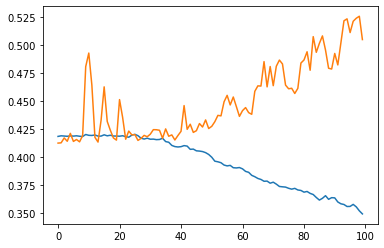

In [30]:
# 训练模型
checkPointSavedModelName = 'model_{epoch:02d}.h5'
checkPoint = ModelCheckpoint(
    filepath=checkPointSavedModelName,
    monitor='val_loss', 
    save_best_only=True)

ae.fit(x_train, 
    y_train,
    epochs=100,
    batch_size=64,
    shuffle=False,
    validation_split=0.1,
    callbacks=[checkPoint]
    )

# plot
plt.plot(ae.history.history["loss"])
plt.plot(ae.history.history["val_loss"])

In [14]:
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

def imgPredictionEvaluate(realImg, predictImg):

  img_array_real  = img_as_float(realImg)
  img_array_predict = img_as_float(predictImg)

  mse_2img = mean_squared_error(img_array_real, img_array_predict)
  ssim_2img = ssim(img_array_real, img_array_predict,
                    data_range=img_array_predict.max() - img_array_predict.min())

  evaluations = [round(mse_2img, 4), round(ssim_2img, 4)]
  return evaluations

1/1 [==============================] - 1s 827ms/step


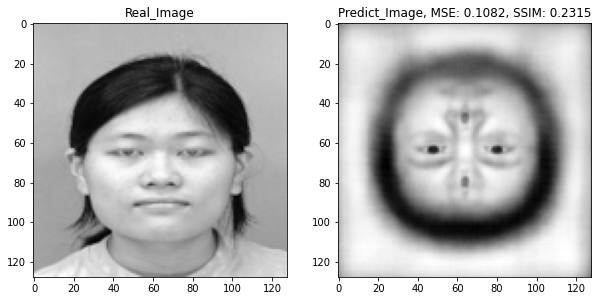

1/1 [==============================] - 0s 21ms/step


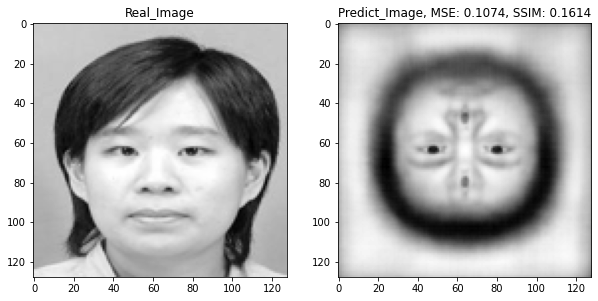

1/1 [==============================] - 0s 21ms/step


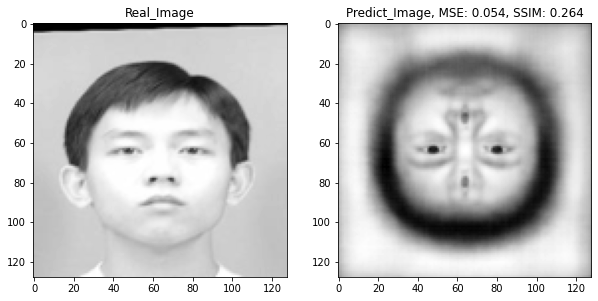

1/1 [==============================] - 0s 20ms/step


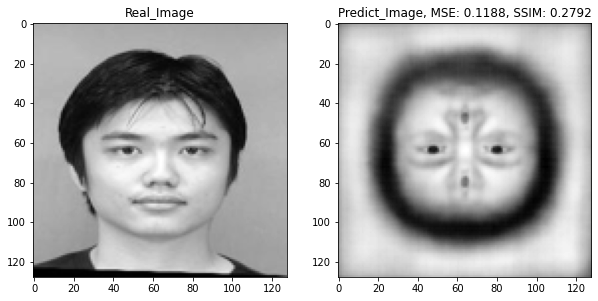

1/1 [==============================] - 0s 21ms/step


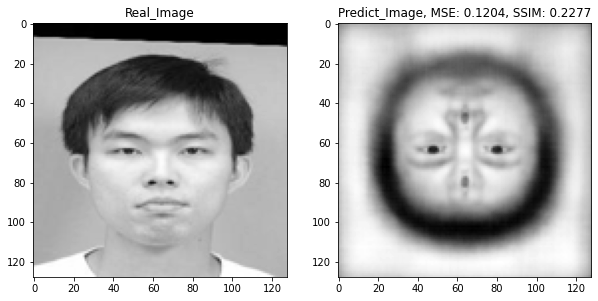

1/1 [==============================] - 0s 20ms/step


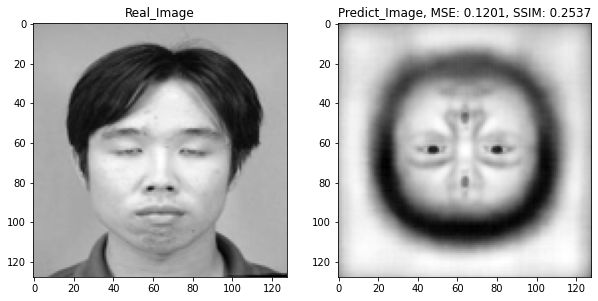

1/1 [==============================] - 0s 20ms/step


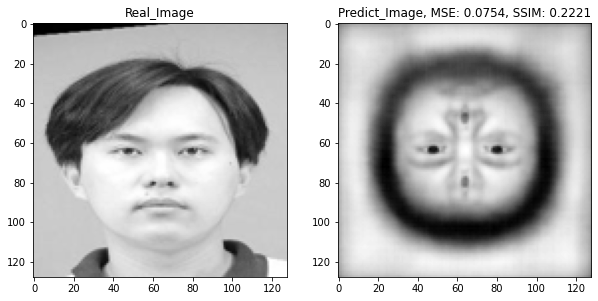

1/1 [==============================] - 0s 20ms/step


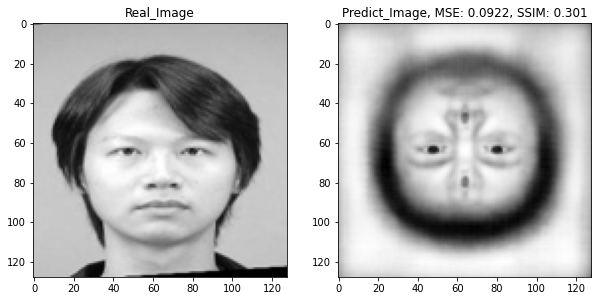

1/1 [==============================] - 0s 20ms/step


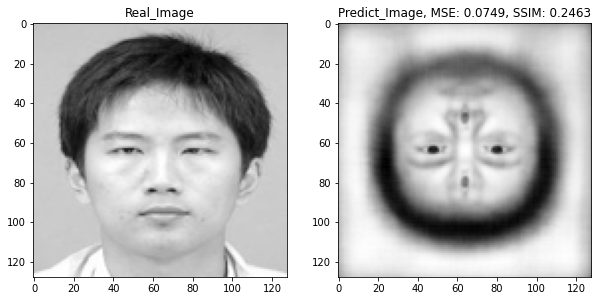

1/1 [==============================] - 0s 20ms/step


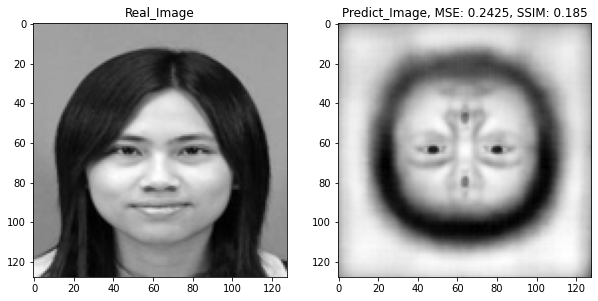

1/1 [==============================] - 0s 21ms/step


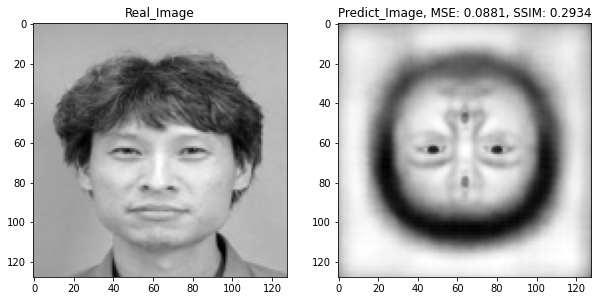

1/1 [==============================] - 0s 20ms/step


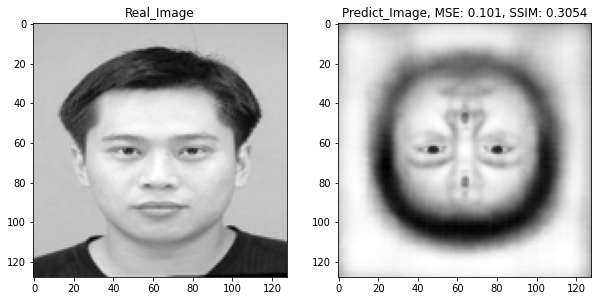

1/1 [==============================] - 0s 20ms/step


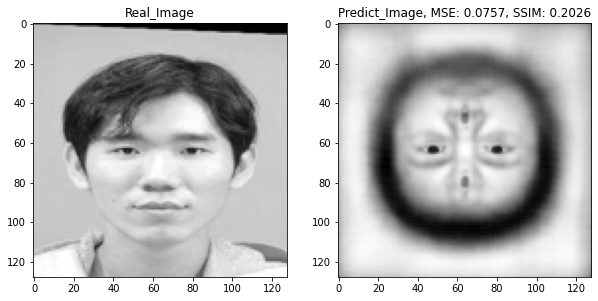

1/1 [==============================] - 0s 20ms/step


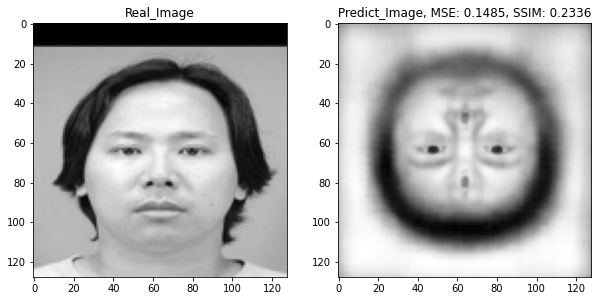

1/1 [==============================] - 0s 21ms/step


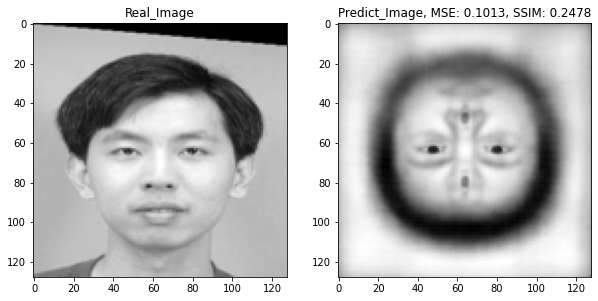

1/1 [==============================] - 0s 20ms/step


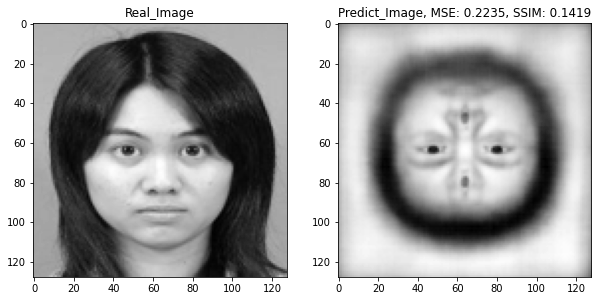

1/1 [==============================] - 0s 20ms/step


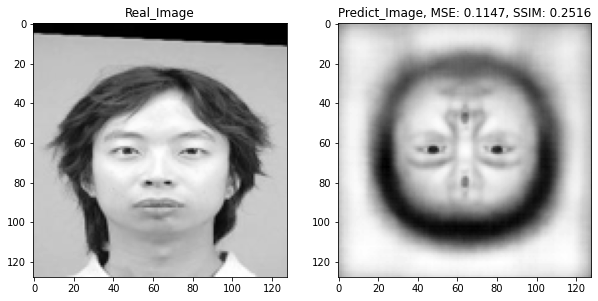

1/1 [==============================] - 0s 20ms/step


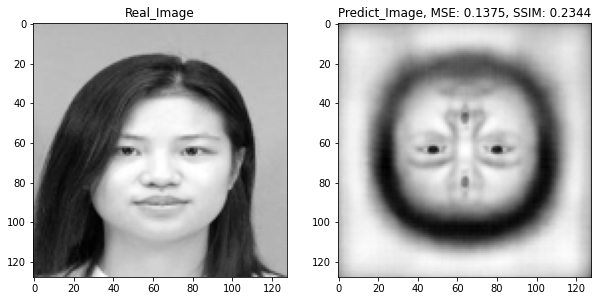

1/1 [==============================] - 0s 20ms/step


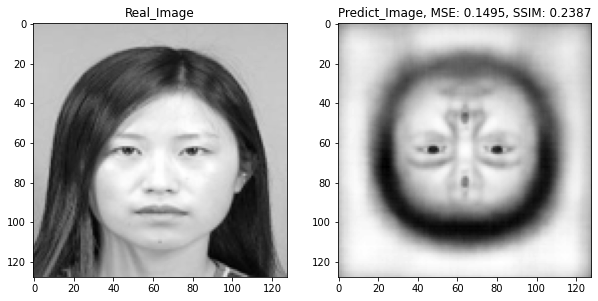

1/1 [==============================] - 0s 20ms/step


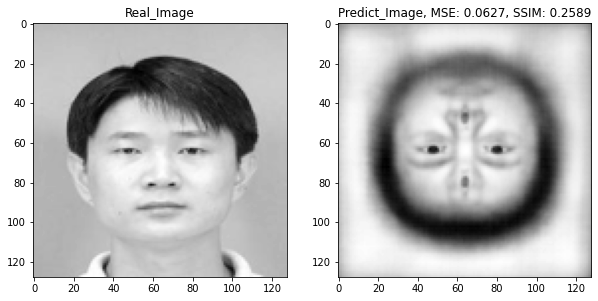

1/1 [==============================] - 0s 20ms/step


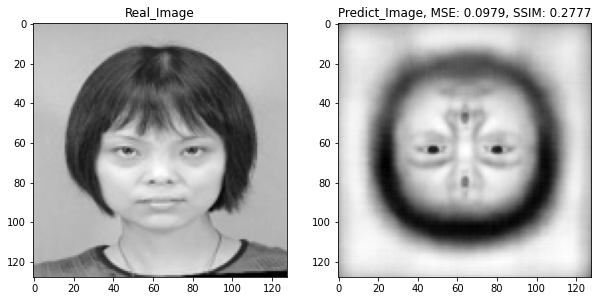

1/1 [==============================] - 0s 20ms/step


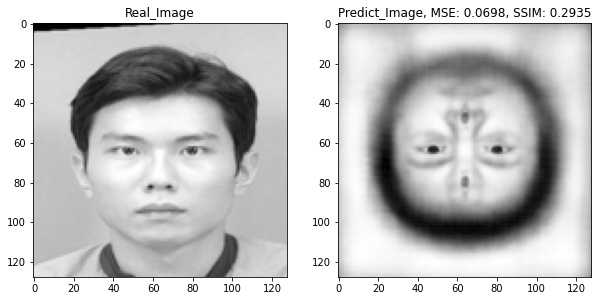

1/1 [==============================] - 0s 24ms/step


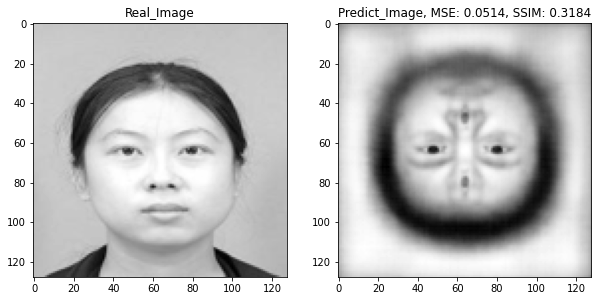

1/1 [==============================] - 0s 20ms/step


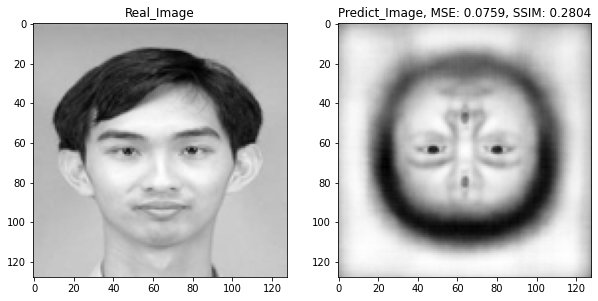

1/1 [==============================] - 0s 21ms/step


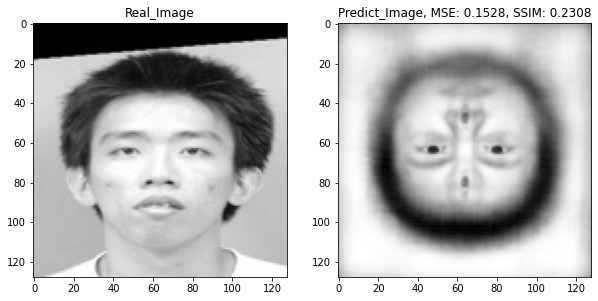

1/1 [==============================] - 0s 25ms/step


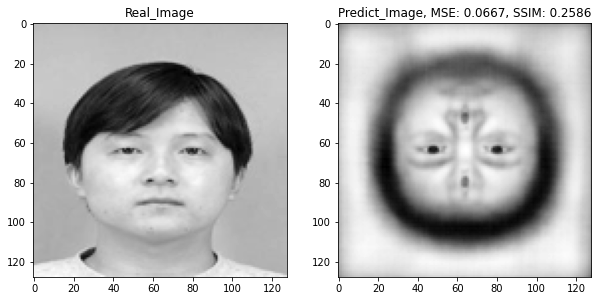

1/1 [==============================] - 0s 20ms/step


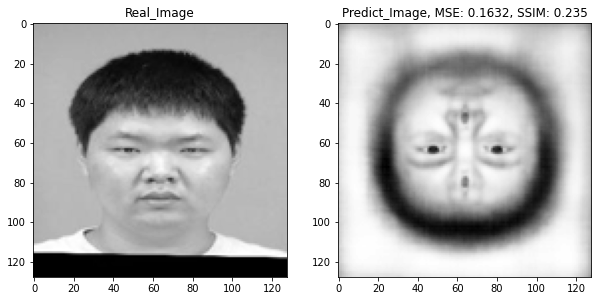

1/1 [==============================] - 0s 20ms/step


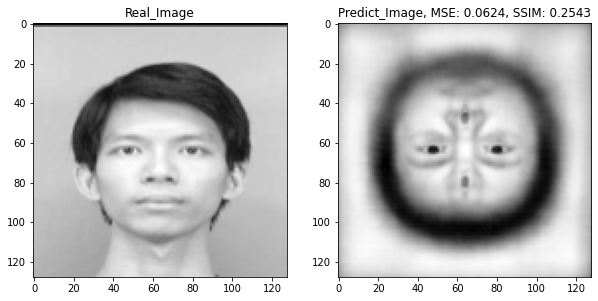

1/1 [==============================] - 0s 20ms/step


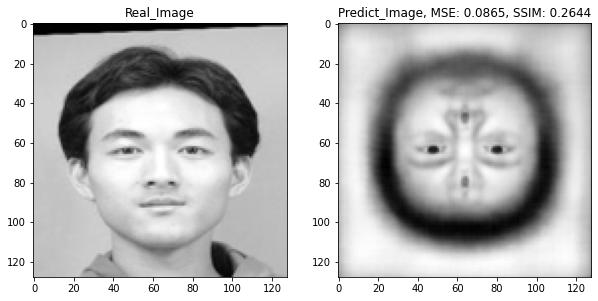

1/1 [==============================] - 0s 20ms/step


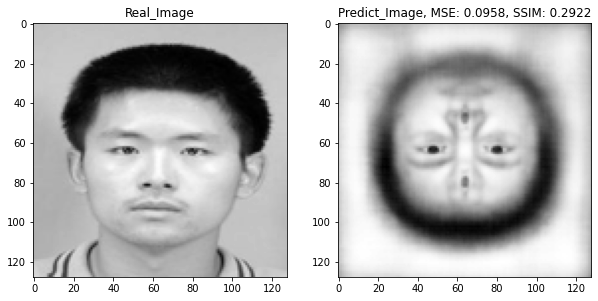

1/1 [==============================] - 0s 21ms/step


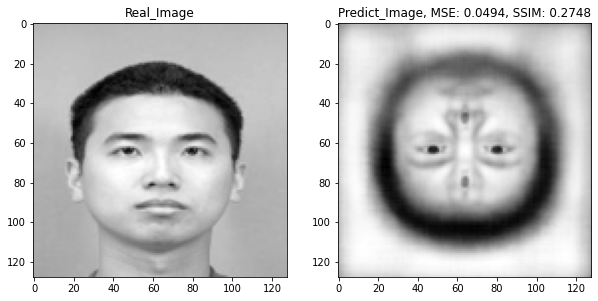

1/1 [==============================] - 0s 21ms/step


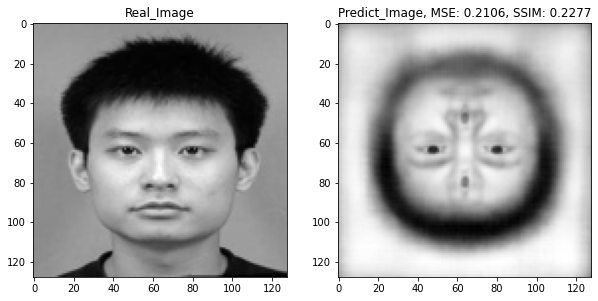

1/1 [==============================] - 0s 21ms/step


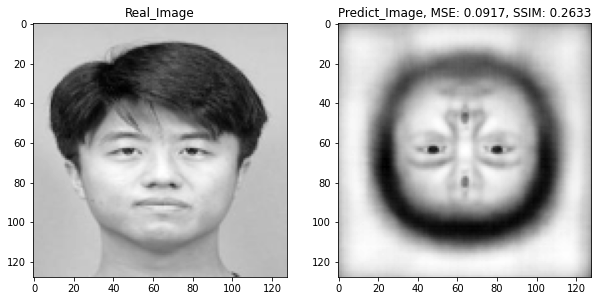

1/1 [==============================] - 0s 21ms/step


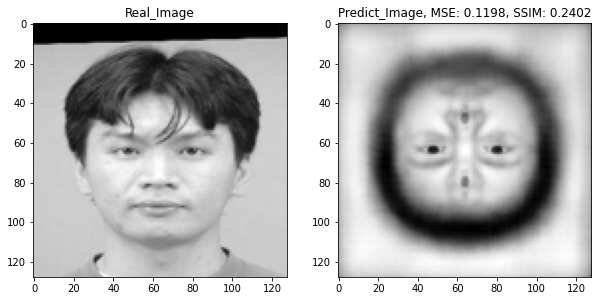

1/1 [==============================] - 0s 20ms/step


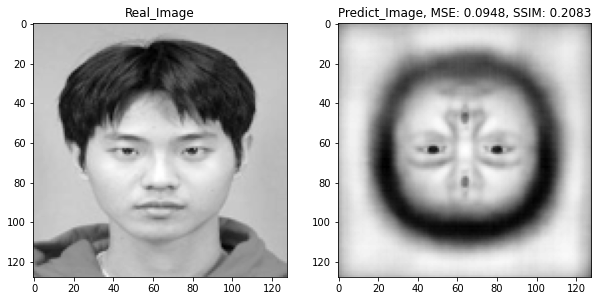

1/1 [==============================] - 0s 23ms/step


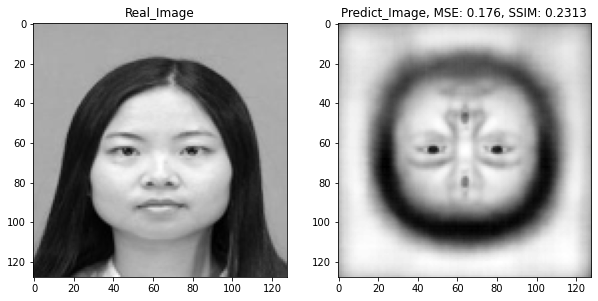

1/1 [==============================] - 0s 21ms/step


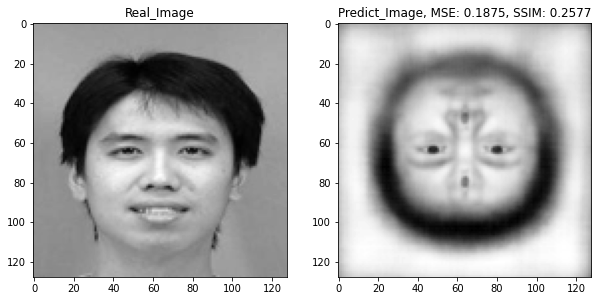

1/1 [==============================] - 0s 21ms/step


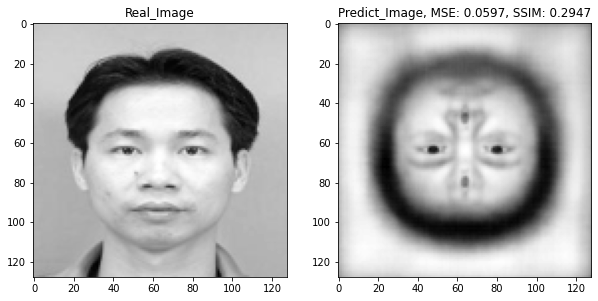

1/1 [==============================] - 0s 21ms/step


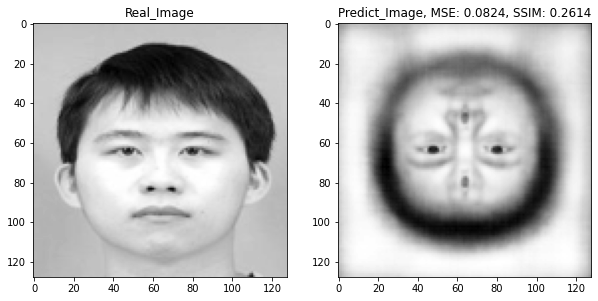

1/1 [==============================] - 0s 20ms/step


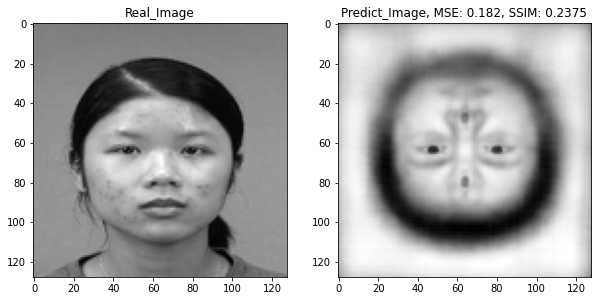

1/1 [==============================] - 0s 21ms/step


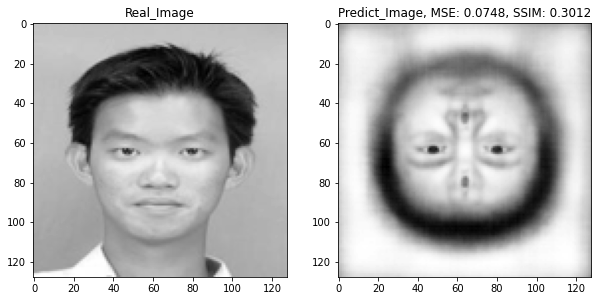

1/1 [==============================] - 0s 20ms/step


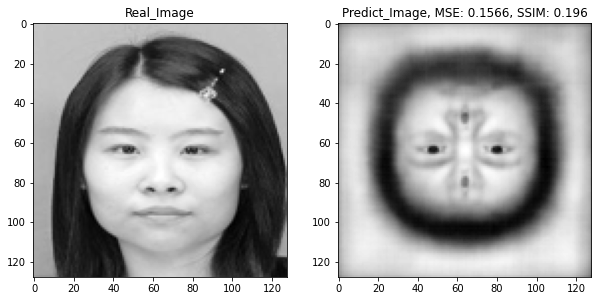

1/1 [==============================] - 0s 21ms/step


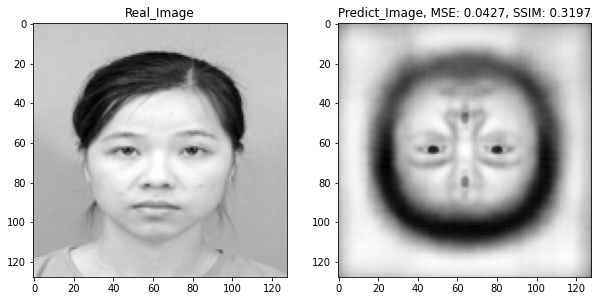

1/1 [==============================] - 0s 21ms/step


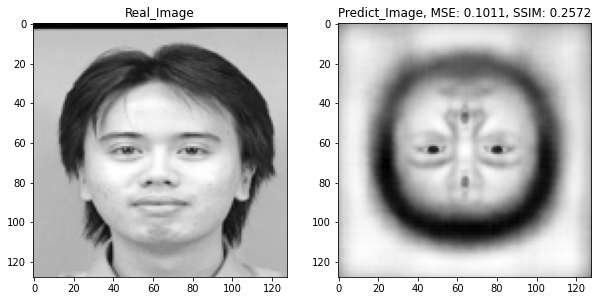

1/1 [==============================] - 0s 21ms/step


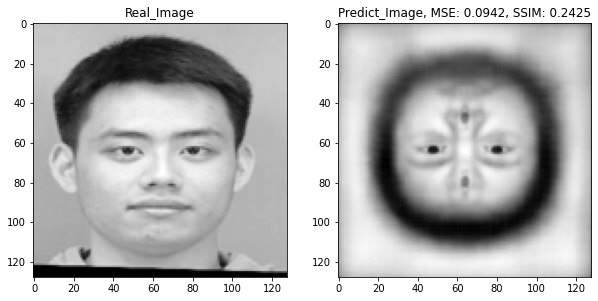

1/1 [==============================] - 0s 21ms/step


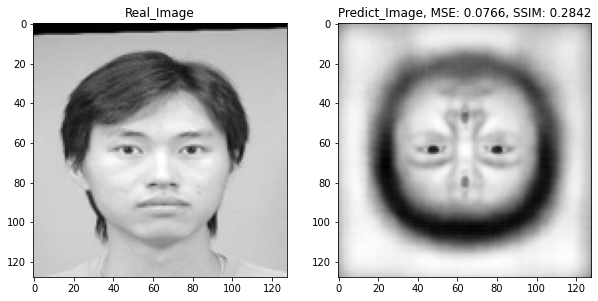

1/1 [==============================] - 0s 22ms/step


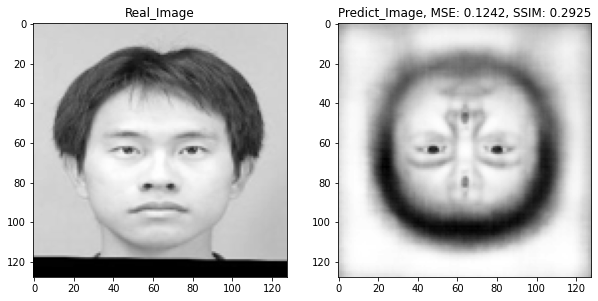

1/1 [==============================] - 0s 22ms/step


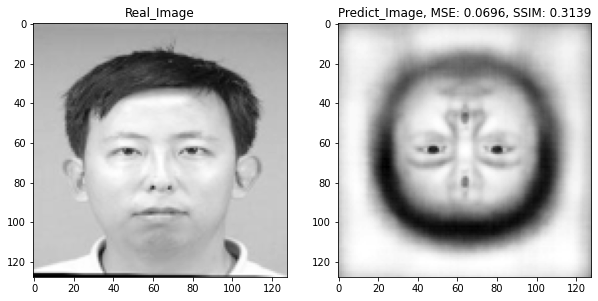

1/1 [==============================] - 0s 23ms/step


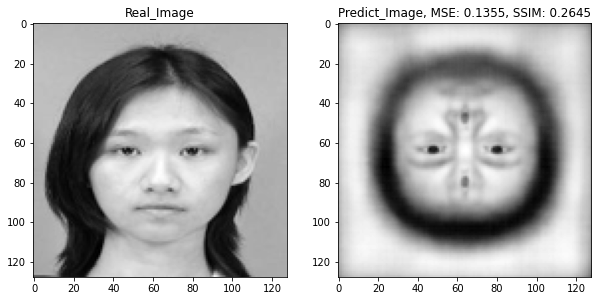

1/1 [==============================] - 0s 23ms/step


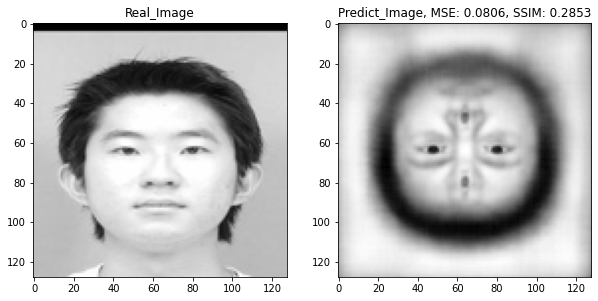

1/1 [==============================] - 0s 21ms/step


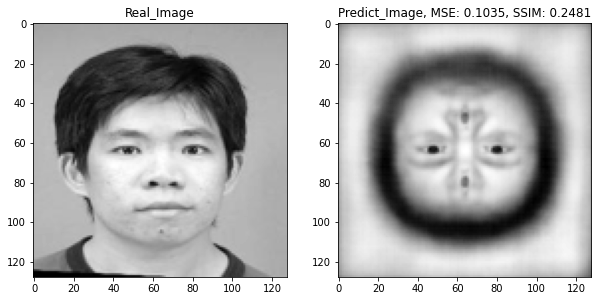

1/1 [==============================] - 0s 30ms/step


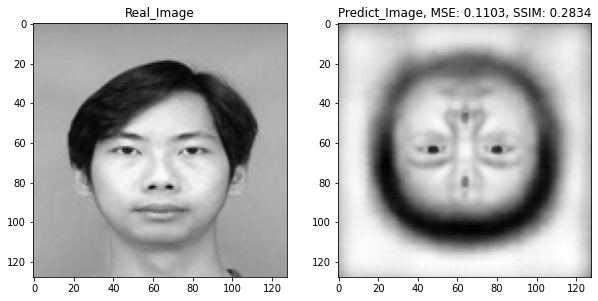

1/1 [==============================] - 0s 25ms/step


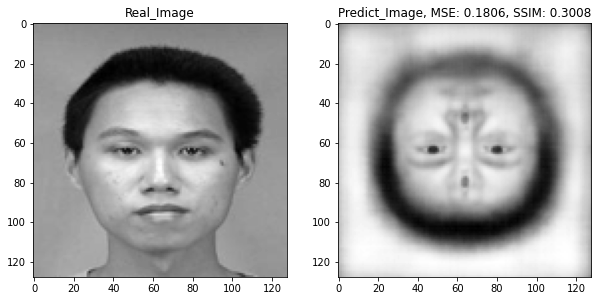

1/1 [==============================] - 0s 26ms/step


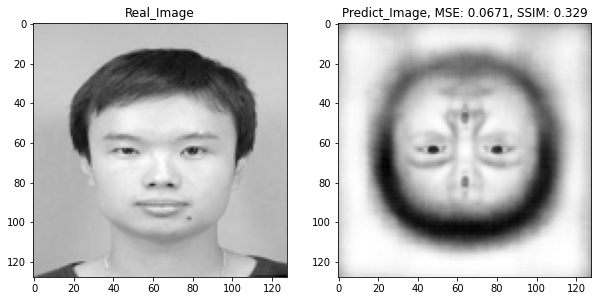

1/1 [==============================] - 0s 23ms/step


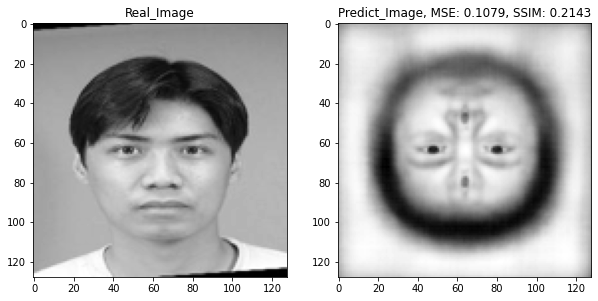

1/1 [==============================] - 0s 23ms/step


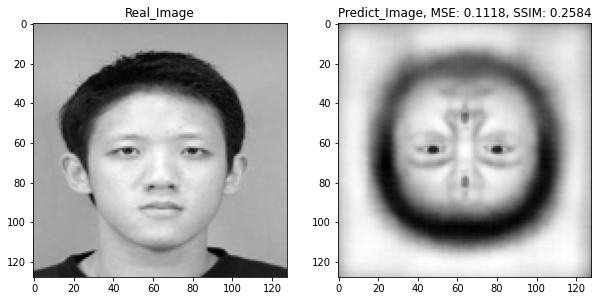

1/1 [==============================] - 0s 23ms/step


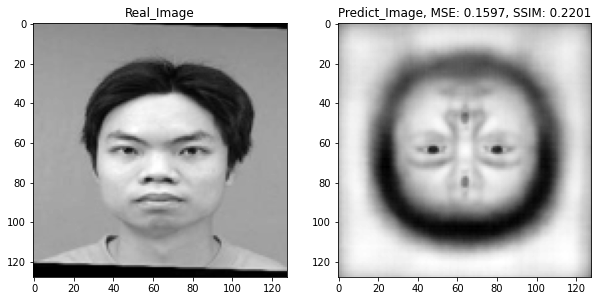

1/1 [==============================] - 0s 21ms/step


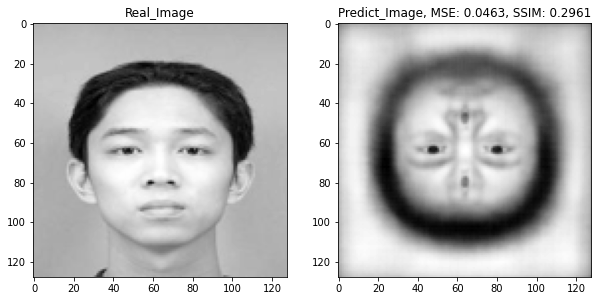

1/1 [==============================] - 0s 23ms/step


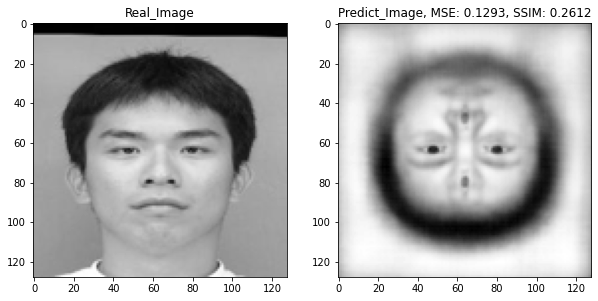

1/1 [==============================] - 0s 20ms/step


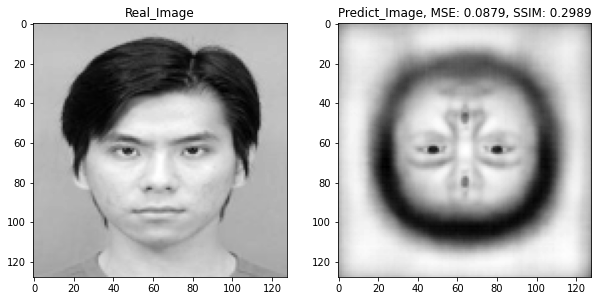

1/1 [==============================] - 0s 22ms/step


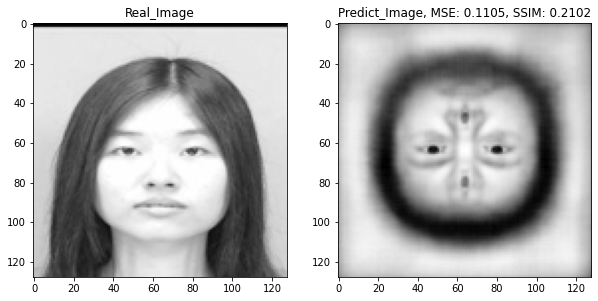

1/1 [==============================] - 0s 20ms/step


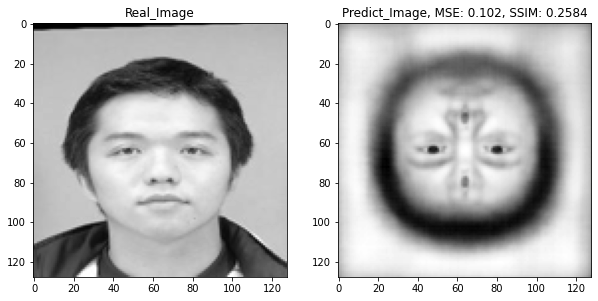

1/1 [==============================] - 0s 21ms/step


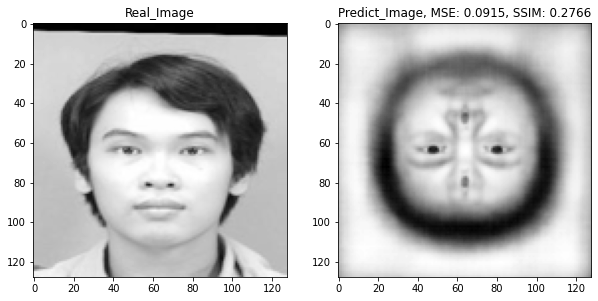

1/1 [==============================] - 0s 22ms/step


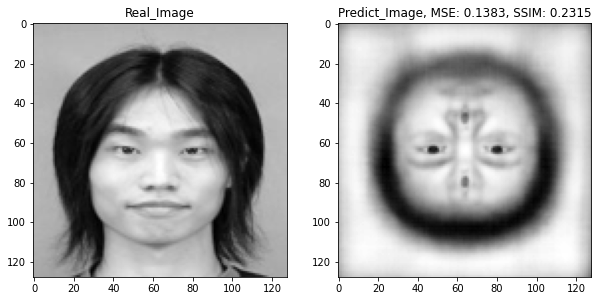

1/1 [==============================] - 0s 20ms/step


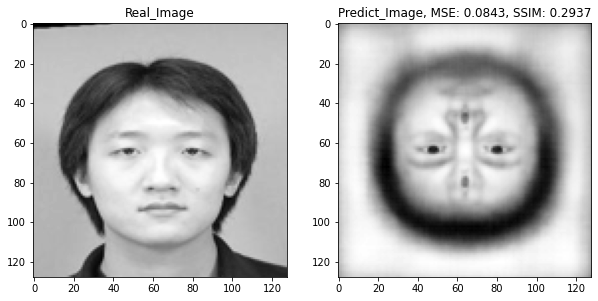

1/1 [==============================] - 0s 22ms/step


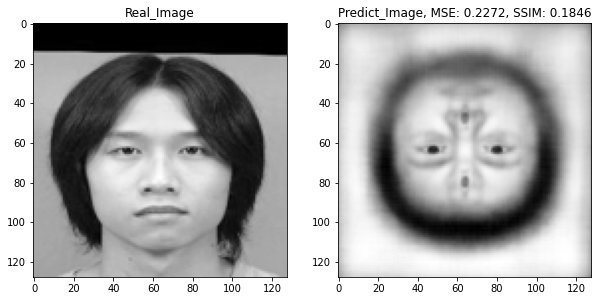

1/1 [==============================] - 0s 23ms/step


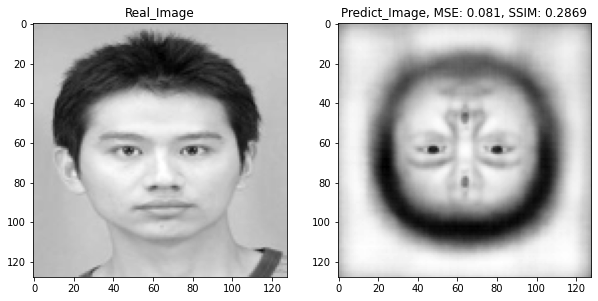

1/1 [==============================] - 0s 22ms/step


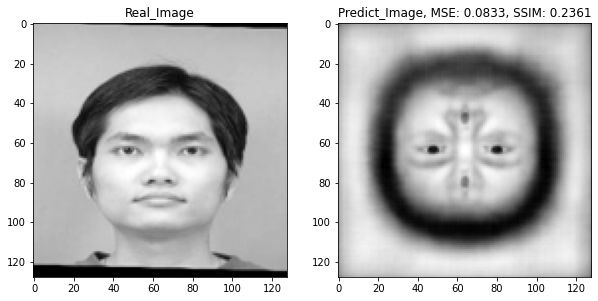

1/1 [==============================] - 0s 24ms/step


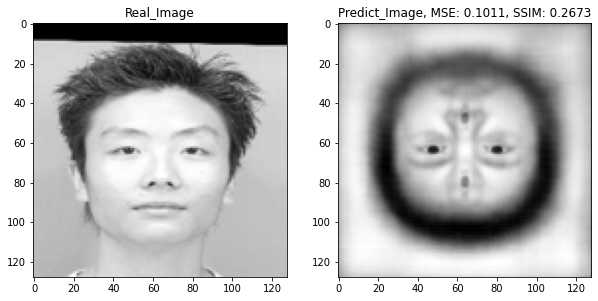

1/1 [==============================] - 0s 23ms/step


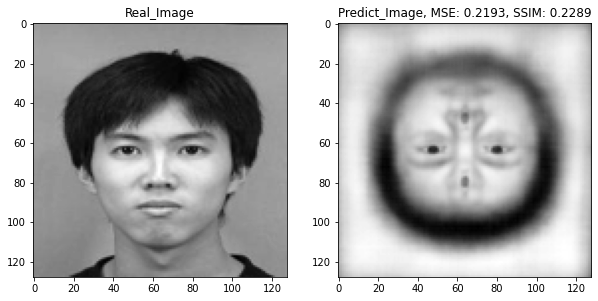

1/1 [==============================] - 0s 21ms/step


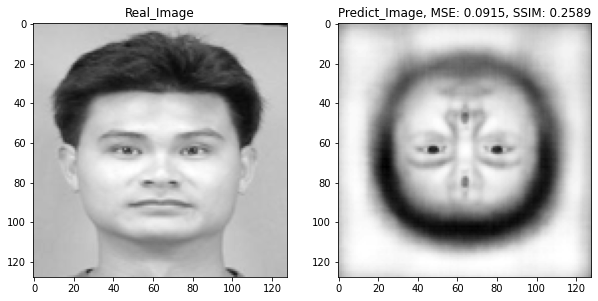

1/1 [==============================] - 0s 22ms/step


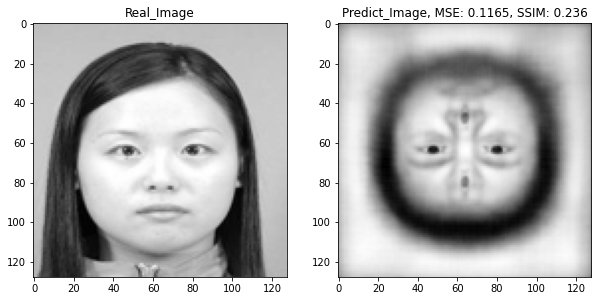

1/1 [==============================] - 0s 26ms/step


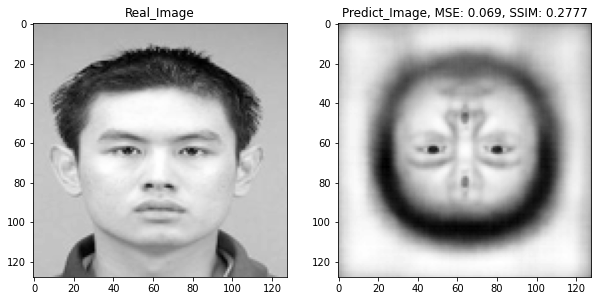

1/1 [==============================] - 0s 23ms/step


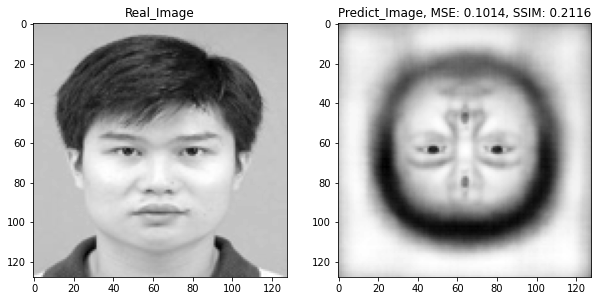

1/1 [==============================] - 0s 24ms/step


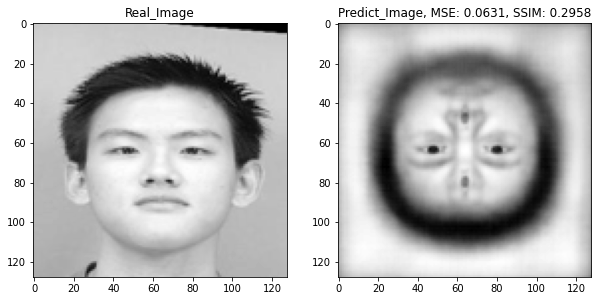

1/1 [==============================] - 0s 22ms/step


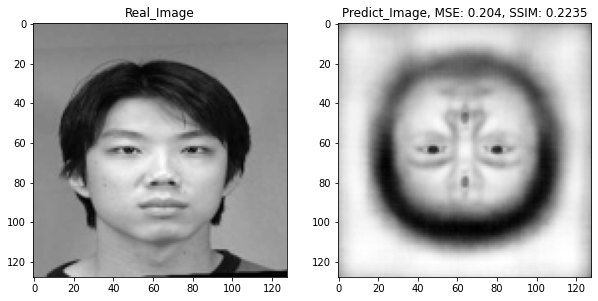

1/1 [==============================] - 0s 21ms/step


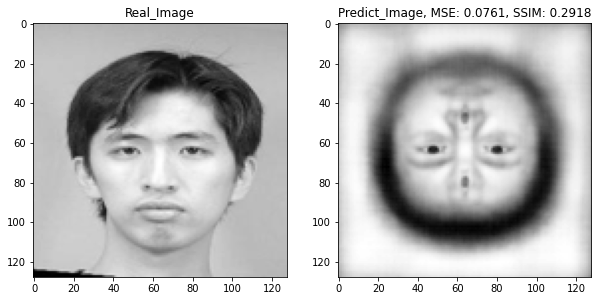

1/1 [==============================] - 0s 26ms/step


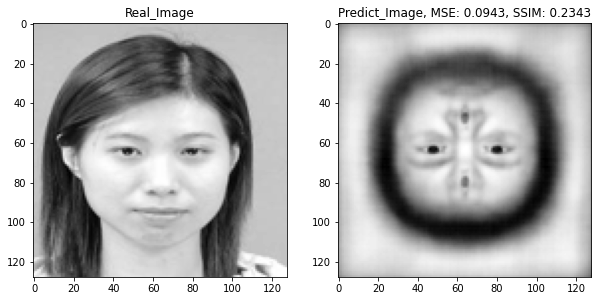

1/1 [==============================] - 0s 29ms/step


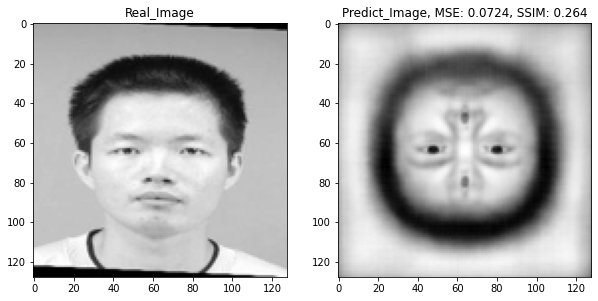

1/1 [==============================] - 0s 20ms/step


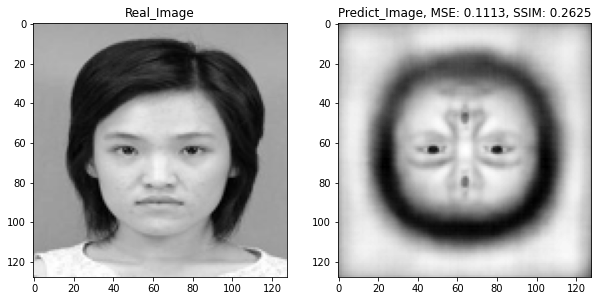

1/1 [==============================] - 0s 22ms/step


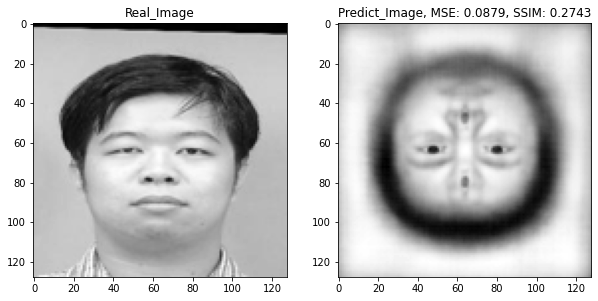

1/1 [==============================] - 0s 28ms/step


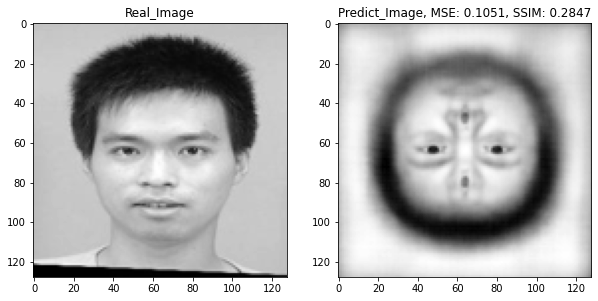

1/1 [==============================] - 0s 23ms/step


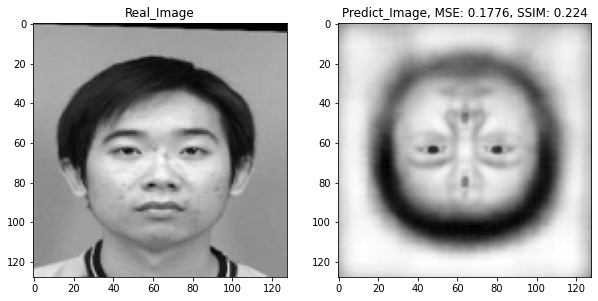

1/1 [==============================] - 0s 22ms/step


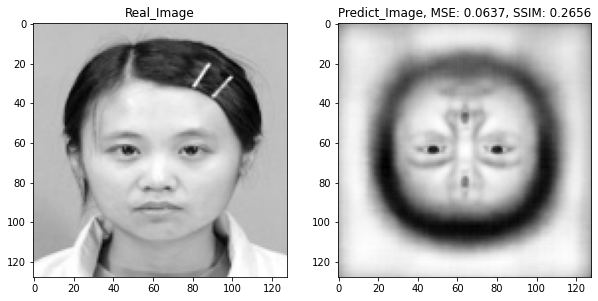

1/1 [==============================] - 0s 23ms/step


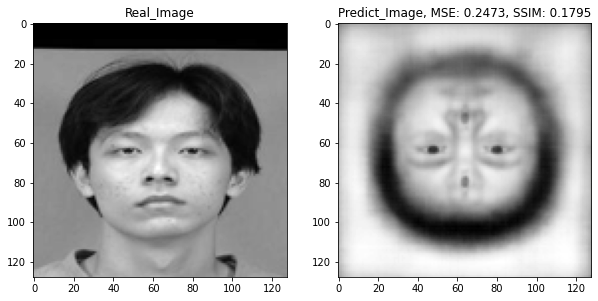

1/1 [==============================] - 0s 22ms/step


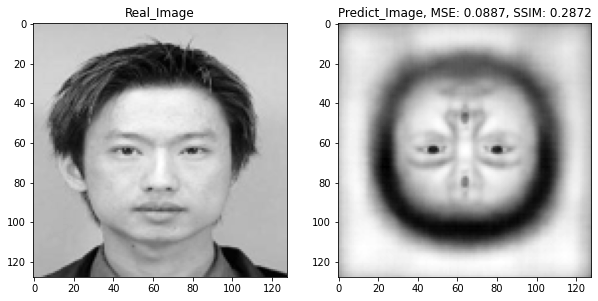

1/1 [==============================] - 0s 23ms/step


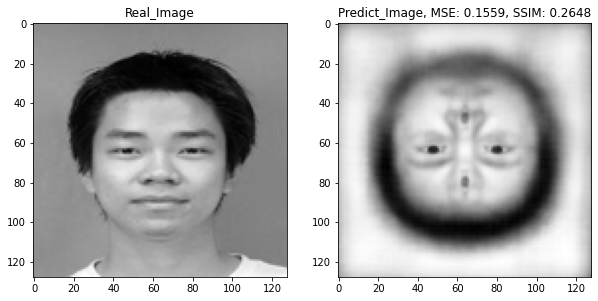

1/1 [==============================] - 0s 23ms/step


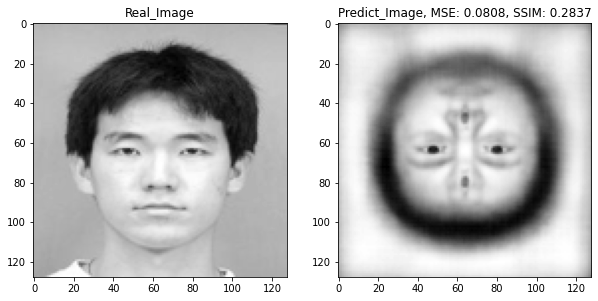

1/1 [==============================] - 0s 22ms/step


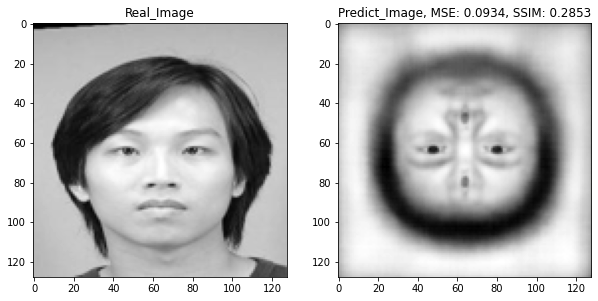

1/1 [==============================] - 0s 21ms/step


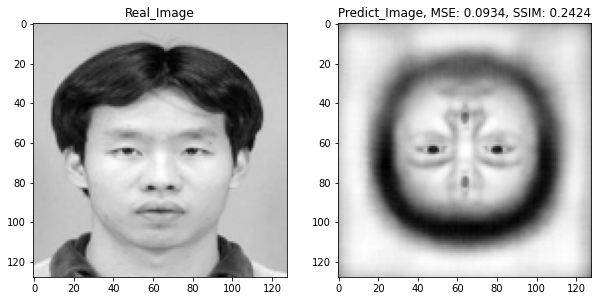

1/1 [==============================] - 0s 22ms/step


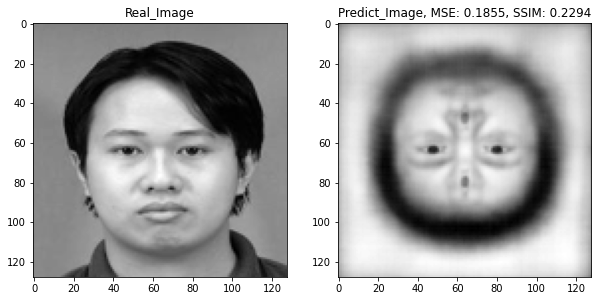

1/1 [==============================] - 0s 22ms/step


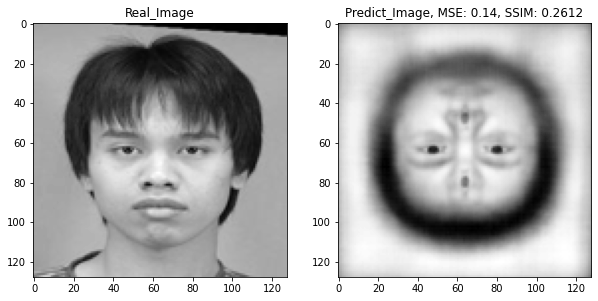

1/1 [==============================] - 0s 22ms/step


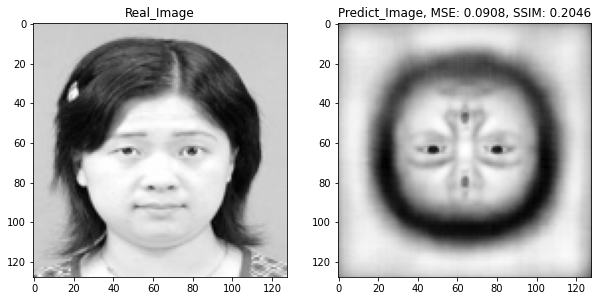

1/1 [==============================] - 0s 22ms/step


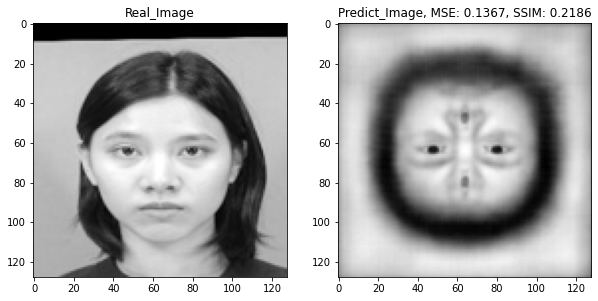

1/1 [==============================] - 0s 24ms/step


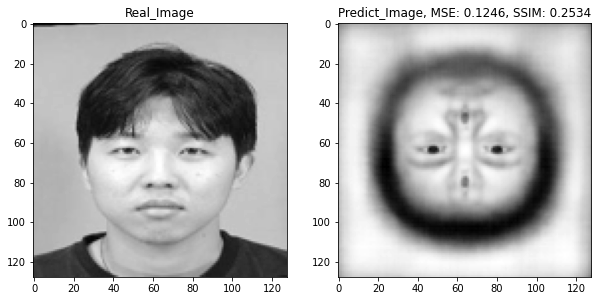

1/1 [==============================] - 0s 24ms/step


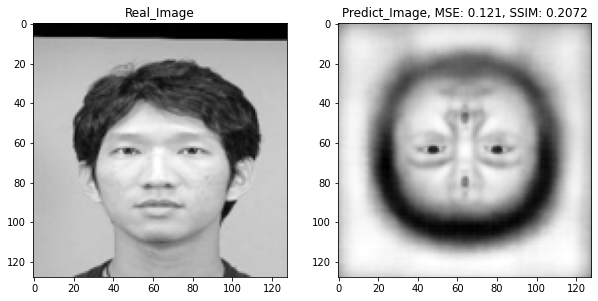

1/1 [==============================] - 0s 21ms/step


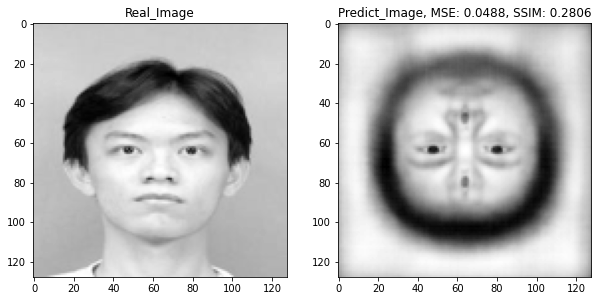

1/1 [==============================] - 0s 23ms/step


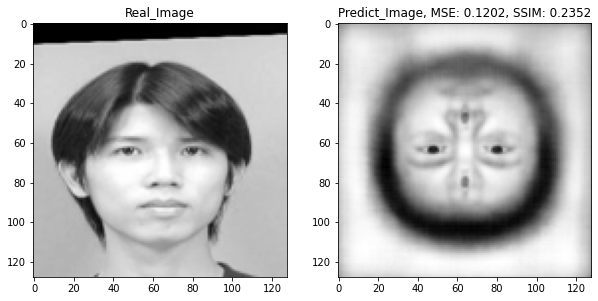

1/1 [==============================] - 0s 29ms/step


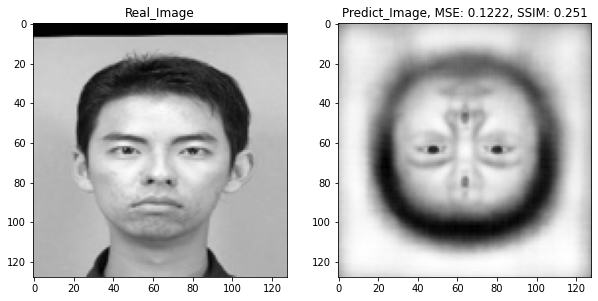

1/1 [==============================] - 0s 30ms/step


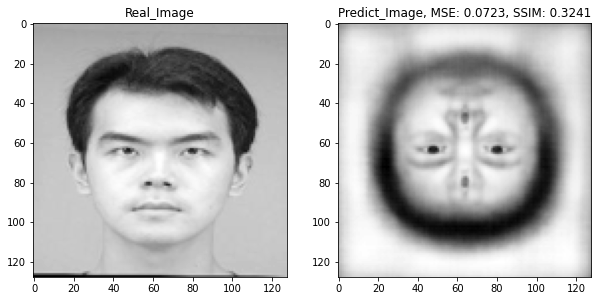

The overall MSE analysis of test dataset: Mean:0.1115, Max:0.2473, Min:0.0427
The overall SSIM analysis of test dataset: Mean:0.2554, Max:0.329, Min:0.1419


In [15]:
# Store all test cases' evaluations
MSE_all = []
SSIM_all = []
# 使用VAE模型生成素描图片
for fileName in os.listdir(filePath3):
    # 读取输入图片
    image_tmp = Image.open(os.path.join(filePath3, fileName)).convert('L')
    
    # 转换为模型的输入格式
    image_tmp = image_tmp.resize((128, 128))
    img_tmp = np.array(image_tmp).reshape((1,128,128,1)).astype('float32') / 255.

    # 使用VAE模型生成素描图片
#    z_mean,_ = encoder.predict(img_tmp)
#    sketch_img = decoder.predict(x=z_mean)
    sketch_img = ae.predict(img_tmp)

    # 转换为PIL Image格式并保存为文件
    sketch_img = sketch_img[0] * 255.
    #sketch_img = np.clip(sketch_img, 0, 255).astype('uint8')
    sketch_img = sketch_img.astype('uint8').reshape((*sketch_img.shape[:-1],))
    sketch_img = Image.fromarray(sketch_img)

    # Calculate MSE and SSIM of predict Image
    evaluations_tmp = imgPredictionEvaluate(realImg = image_tmp, predictImg = sketch_img)
    mse_tmp = evaluations_tmp[0]
    ssim_tmp = evaluations_tmp[1]
    MSE_all.append(mse_tmp)
    SSIM_all.append(ssim_tmp)
    # 显示生成的素描图片
    plt.figure(figsize = (10,10))
    plt.subplot(1,2,1)
    plt.title('Real_Image')
    plt.imshow(image_tmp, cmap = 'gray')
    plt.subplot(1,2,2)
    name = 'Predict_Image, MSE: {}, SSIM: {}'.format(mse_tmp, ssim_tmp)
    plt.title(name)
    plt.imshow(sketch_img, cmap = 'gray')
    plt.show()

# calculate the overall MSE & SSIM
MSE_all_Mean = round(np.mean(MSE_all), 4)
MSE_all_Max = np.max(MSE_all)
MSE_all_Min = np.min(MSE_all)

SSIM_all_Mean = round(np.mean(SSIM_all), 4)
SSIM_all_Max = np.max(SSIM_all)
SSIM_all_Min = np.min(SSIM_all) 

print('The overall MSE analysis of test dataset: Mean:{}, Max:{}, Min:{}'.format(MSE_all_Mean, MSE_all_Max, MSE_all_Min))
print('The overall SSIM analysis of test dataset: Mean:{}, Max:{}, Min:{}'.format(SSIM_all_Mean, SSIM_all_Max, SSIM_all_Min))

1/1 [==============================] - 0s 36ms/step
0.99041545
0.34985477


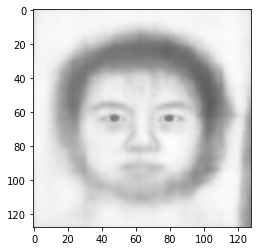

1/1 [==============================] - 0s 20ms/step
0.99908745
0.1966429


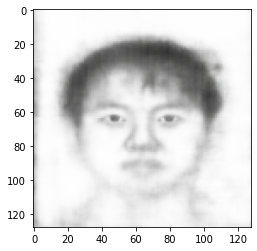

1/1 [==============================] - 0s 20ms/step
0.99849534
0.25553277


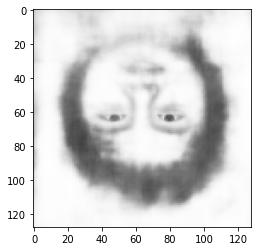

1/1 [==============================] - 0s 21ms/step
0.9960383
0.25077865


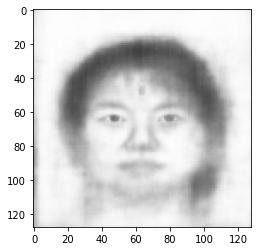

1/1 [==============================] - 0s 20ms/step
0.998879
0.30388907


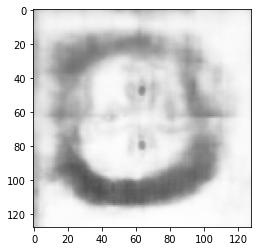

1/1 [==============================] - 0s 20ms/step
0.9946585
0.34547633


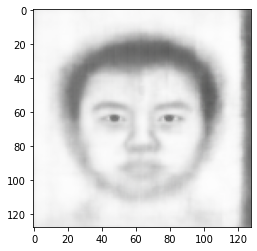

1/1 [==============================] - 0s 19ms/step
0.9956988
0.14434169


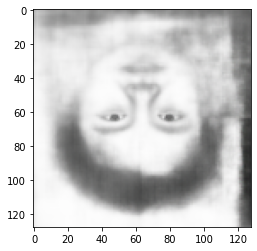

1/1 [==============================] - 0s 20ms/step
0.9994747
0.06794753


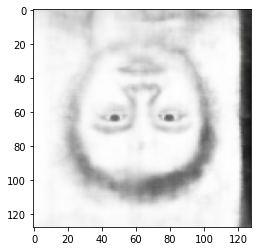

1/1 [==============================] - 0s 20ms/step
0.9992349
0.19097415


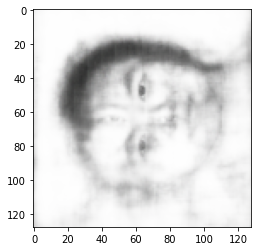

1/1 [==============================] - 0s 20ms/step
0.99771994
0.33717594


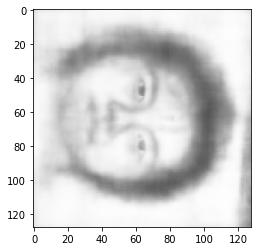

1/1 [==============================] - 0s 19ms/step
0.9942941
0.05915529


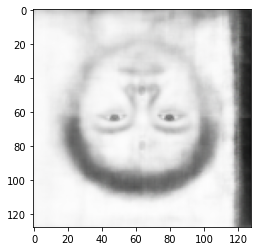

1/1 [==============================] - 0s 20ms/step
0.99453557
0.19148718


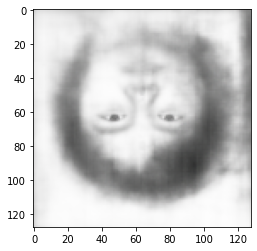

1/1 [==============================] - 0s 21ms/step
0.99854386
0.3180738


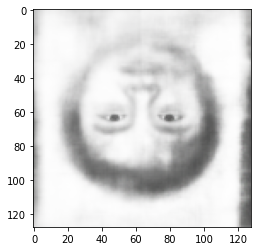

1/1 [==============================] - 0s 19ms/step
0.996064
0.32056326


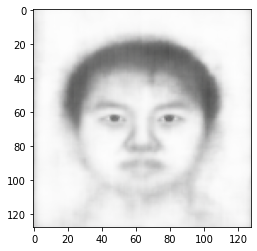

1/1 [==============================] - 0s 20ms/step
0.9923483
0.25107253


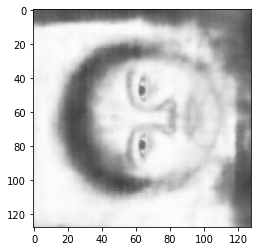

1/1 [==============================] - 0s 20ms/step
0.998777
0.23111482


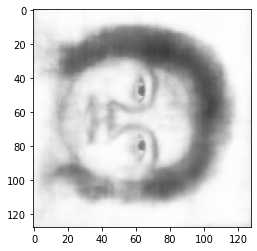

1/1 [==============================] - 0s 20ms/step
0.9920787
0.34863615


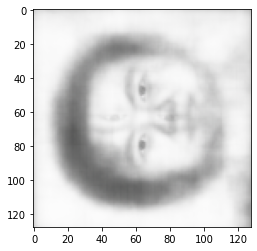

1/1 [==============================] - 0s 22ms/step
0.9890483
0.26138625


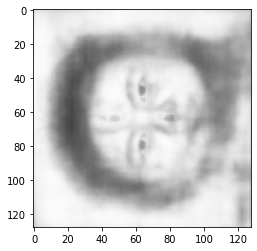

1/1 [==============================] - 0s 23ms/step
0.99571145
0.19078991


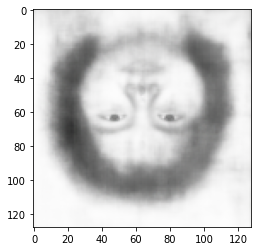

1/1 [==============================] - 0s 24ms/step
0.9972978
0.19268613


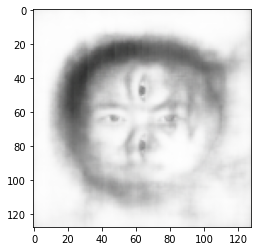

1/1 [==============================] - 0s 21ms/step
0.99664944
0.32790014


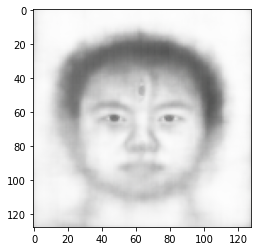

1/1 [==============================] - 0s 23ms/step
0.998058
0.062170006


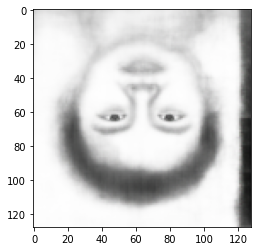

1/1 [==============================] - 0s 21ms/step
0.99686533
0.34682626


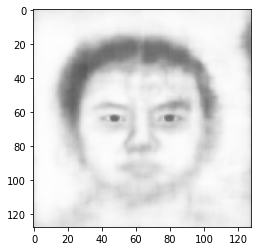

1/1 [==============================] - 0s 21ms/step
0.99324155
0.3854565


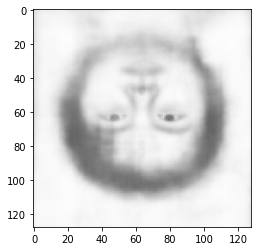

1/1 [==============================] - 0s 21ms/step
0.9988739
0.361693


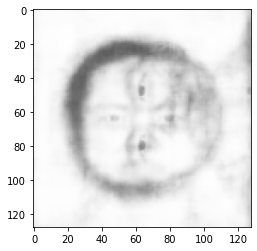

1/1 [==============================] - 0s 21ms/step
0.9998995
0.31758988


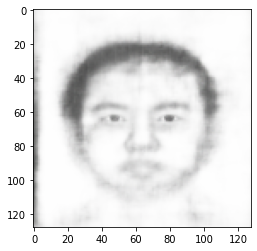

1/1 [==============================] - 0s 22ms/step
0.998442
0.37489057


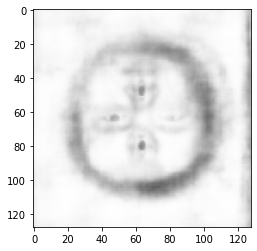

1/1 [==============================] - 0s 21ms/step
0.9948797
0.32268792


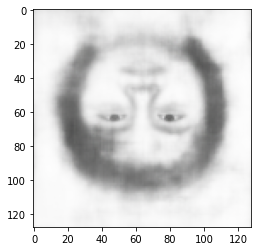

1/1 [==============================] - 0s 22ms/step
0.9943791
0.041249298


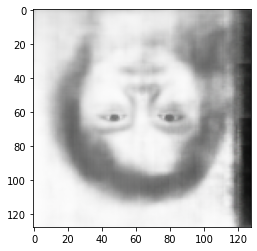

1/1 [==============================] - 0s 21ms/step
0.997776
0.22327967


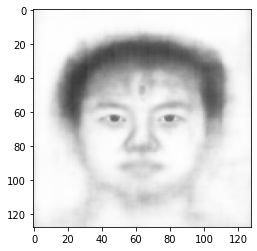

1/1 [==============================] - 0s 21ms/step
0.9977639
0.29925945


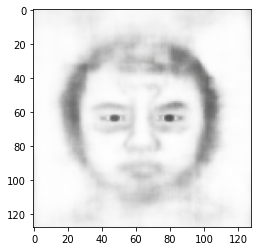

1/1 [==============================] - 0s 23ms/step
0.99884963
0.326426


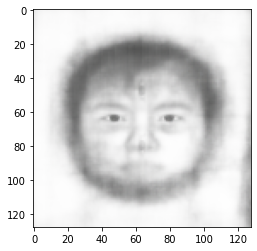

1/1 [==============================] - 0s 21ms/step
0.99728143
0.30933177


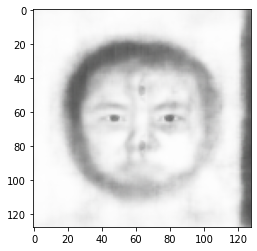

1/1 [==============================] - 0s 23ms/step
0.98664445
0.3137472


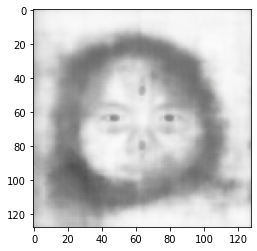

1/1 [==============================] - 0s 21ms/step
0.9744888
0.35496056


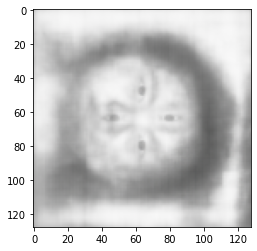

1/1 [==============================] - 0s 21ms/step
0.9936212
0.24699675


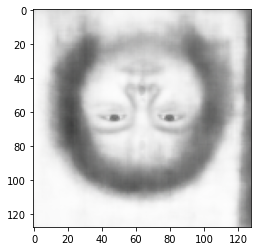

1/1 [==============================] - 0s 21ms/step
0.9962037
0.3692427


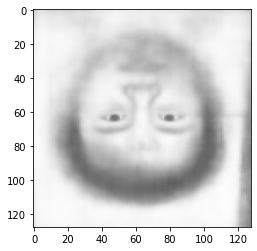

1/1 [==============================] - 0s 21ms/step
0.99290377
0.3628224


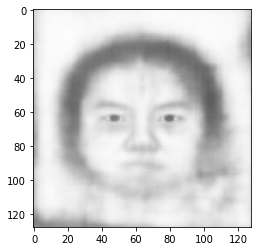

1/1 [==============================] - 0s 26ms/step
0.9983638
0.29877722


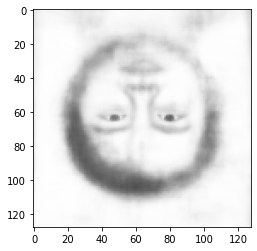

1/1 [==============================] - 0s 22ms/step
0.99748164
0.35607377


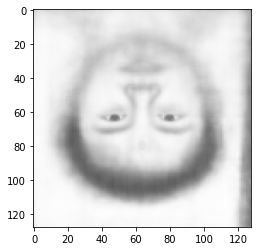

1/1 [==============================] - 0s 21ms/step
0.99899656
0.29008073


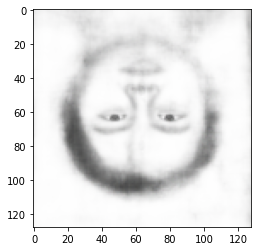

1/1 [==============================] - 0s 26ms/step
0.9911026
0.37396467


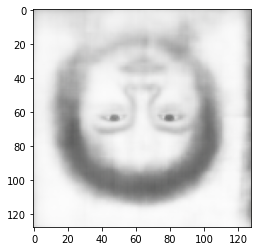

1/1 [==============================] - 0s 22ms/step
0.99745923
0.24232654


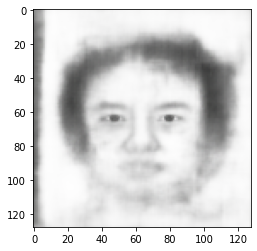

1/1 [==============================] - 0s 22ms/step
0.9992544
0.35823774


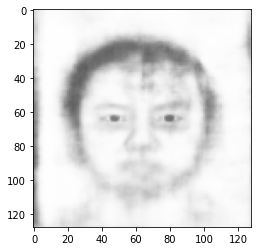

1/1 [==============================] - 0s 21ms/step
0.99815255
0.32367095


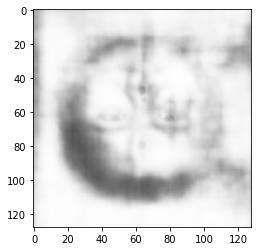

1/1 [==============================] - 0s 25ms/step
0.9948249
0.35317618


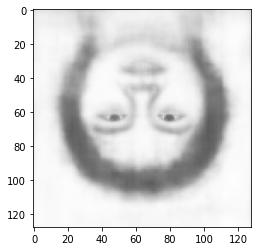

1/1 [==============================] - 0s 20ms/step
0.9969202
0.3212713


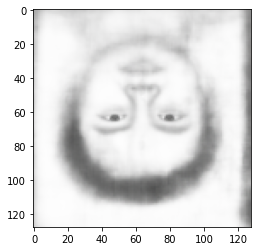

1/1 [==============================] - 0s 21ms/step
0.9916739
0.37778586


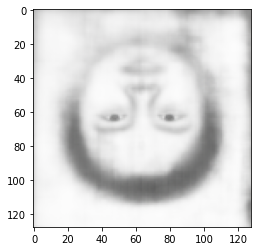

1/1 [==============================] - 0s 23ms/step
0.99878746
0.3808128


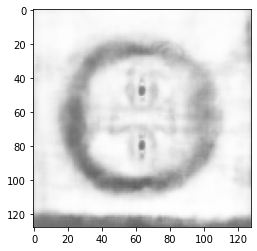

1/1 [==============================] - 0s 22ms/step
0.9995684
0.33439186


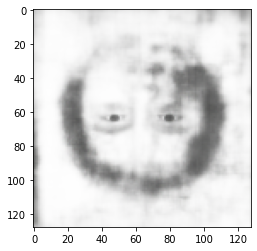

1/1 [==============================] - 0s 21ms/step
0.99659353
0.23294292


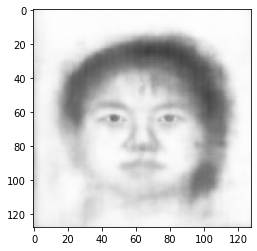

1/1 [==============================] - 0s 22ms/step
0.995843
0.29841653


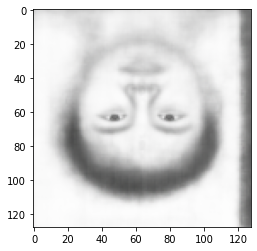

1/1 [==============================] - 0s 21ms/step
0.99726945
0.3538761


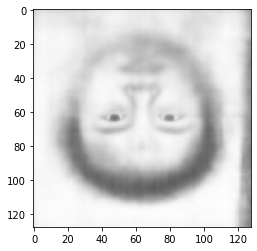

1/1 [==============================] - 0s 23ms/step
0.99153894
0.29654503


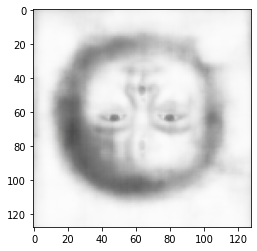

1/1 [==============================] - 0s 21ms/step
0.999419
0.30975163


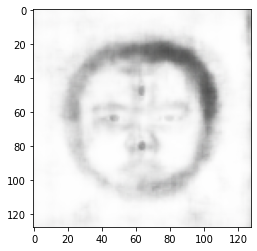

1/1 [==============================] - 0s 22ms/step
0.9909667
0.31081173


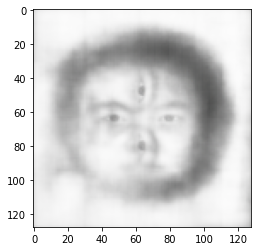

1/1 [==============================] - 0s 23ms/step
0.9947279
0.4075633


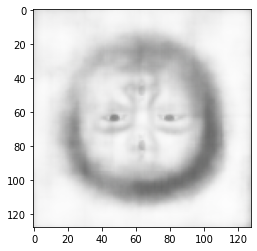

1/1 [==============================] - 0s 22ms/step
0.9940136
0.36336383


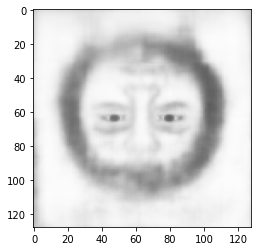

1/1 [==============================] - 0s 22ms/step
0.9924563
0.37106884


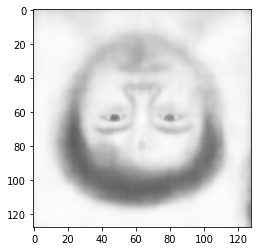

1/1 [==============================] - 0s 21ms/step
0.99765706
0.26467264


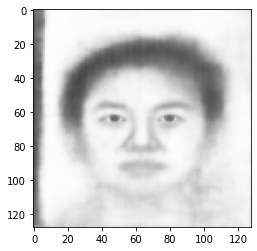

1/1 [==============================] - 0s 21ms/step
0.9936767
0.25288615


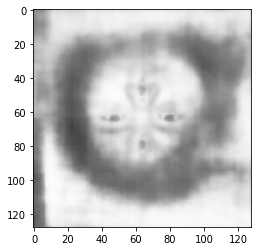

1/1 [==============================] - 0s 21ms/step
0.9911445
0.33020395


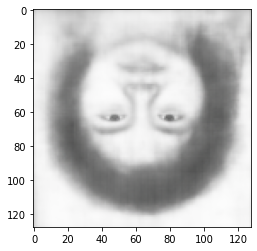

1/1 [==============================] - 0s 22ms/step
0.9989139
0.2423854


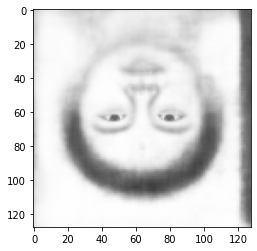

1/1 [==============================] - 0s 21ms/step
0.9994622
0.21833612


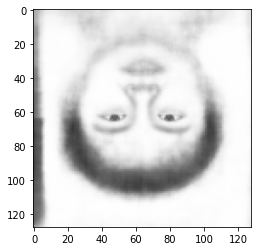

1/1 [==============================] - 0s 22ms/step
0.99126256
0.3498287


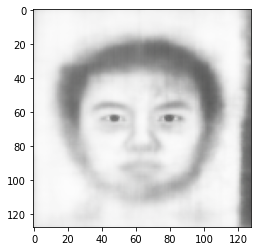

1/1 [==============================] - 0s 21ms/step
0.9980326
0.3492231


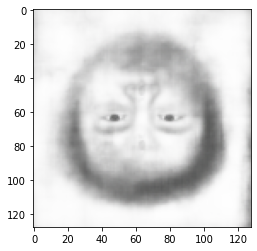

1/1 [==============================] - 0s 22ms/step
0.9935888
0.32587847


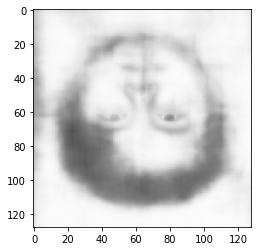

1/1 [==============================] - 0s 30ms/step
0.9957824
0.31485853


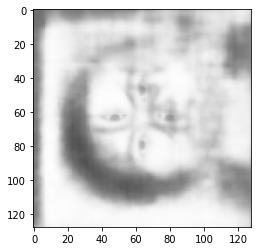

1/1 [==============================] - 0s 21ms/step
0.9922655
0.268474


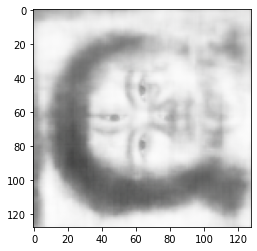

1/1 [==============================] - 0s 23ms/step
0.99843067
0.3236006


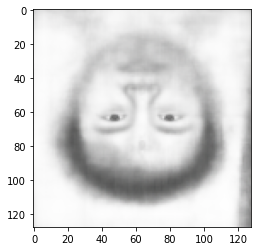

1/1 [==============================] - 0s 20ms/step
0.9936738
0.39779168


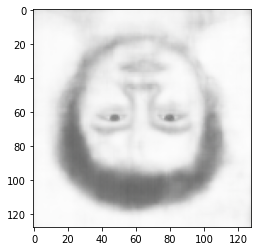

1/1 [==============================] - 0s 28ms/step
0.99180096
0.24499108


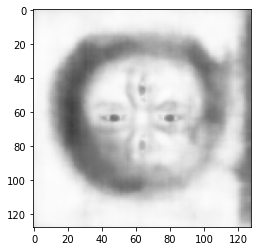

1/1 [==============================] - 0s 21ms/step
0.99673057
0.23133582


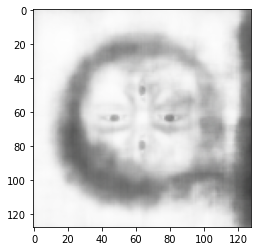

1/1 [==============================] - 0s 21ms/step
0.9946991
0.1784243


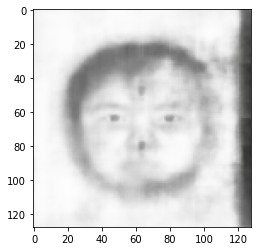

1/1 [==============================] - 0s 21ms/step
0.9974381
0.24736372


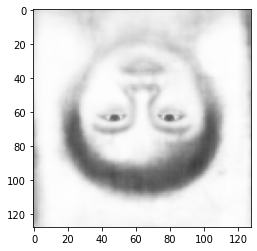

1/1 [==============================] - 0s 21ms/step
0.9980246
0.32017726


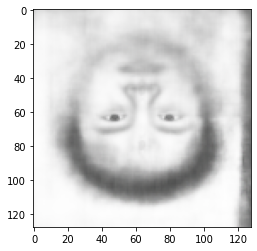

1/1 [==============================] - 0s 21ms/step
0.9887522
0.13792042


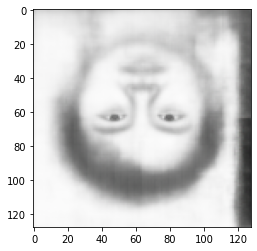

1/1 [==============================] - 0s 21ms/step
0.98692316
0.33121747


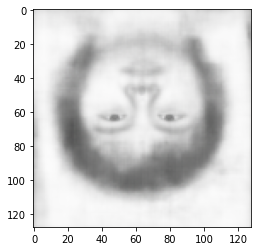

1/1 [==============================] - 0s 23ms/step
0.9957349
0.35276788


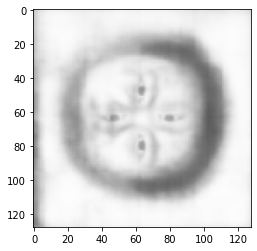

1/1 [==============================] - 0s 20ms/step
0.99804544
0.34369913


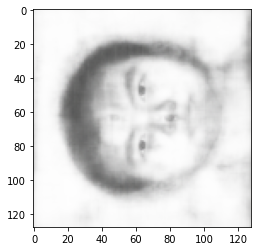

1/1 [==============================] - 0s 25ms/step
0.99684876
0.3133051


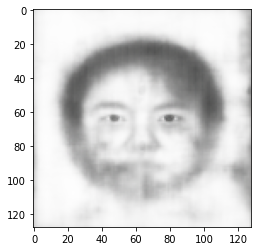

1/1 [==============================] - 0s 23ms/step
0.99937004
0.27602383


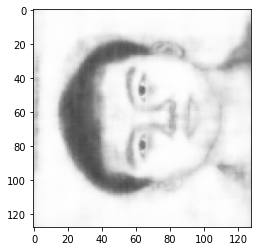

1/1 [==============================] - 0s 23ms/step
0.9928269
0.4009092


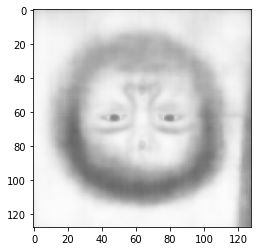

1/1 [==============================] - 0s 28ms/step
0.9980596
0.26408613


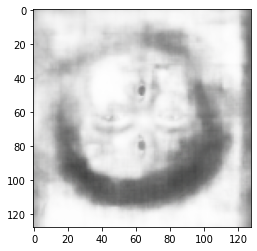

1/1 [==============================] - 0s 23ms/step
0.99820006
0.3949404


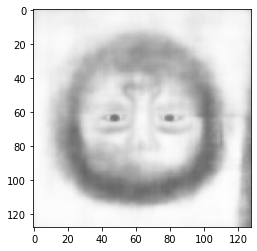

1/1 [==============================] - 0s 31ms/step
0.9989961
0.16960834


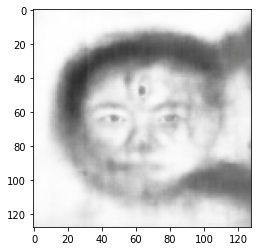

1/1 [==============================] - 0s 21ms/step
0.99670094
0.37557894


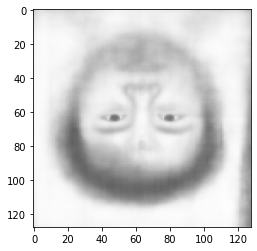

1/1 [==============================] - 0s 28ms/step
0.9987
0.30578086


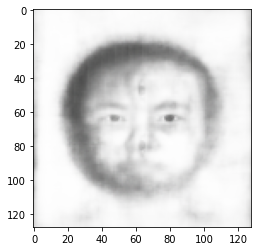

1/1 [==============================] - 0s 29ms/step
0.9986473
0.3240786


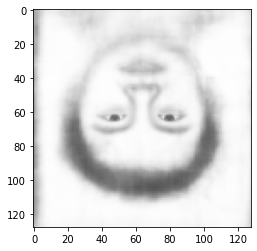

1/1 [==============================] - 0s 23ms/step
0.9915065
0.02814327


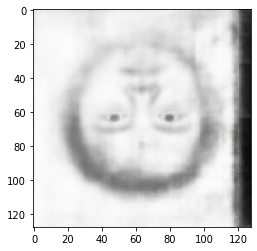

1/1 [==============================] - 0s 23ms/step
0.9983386
0.2878091


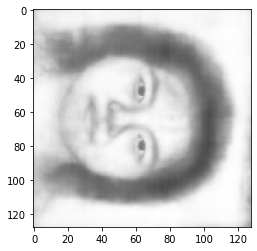

1/1 [==============================] - 0s 27ms/step
0.9949955
0.32479846


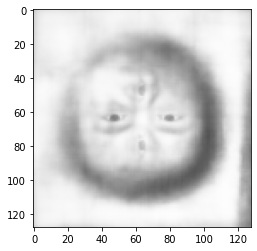

1/1 [==============================] - 0s 24ms/step
0.99933594
0.22841837


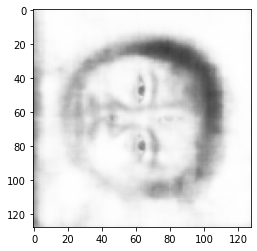

1/1 [==============================] - 0s 23ms/step
0.99119544
0.35108644


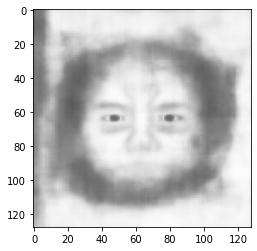

1/1 [==============================] - 0s 23ms/step
0.9978523
0.14744505


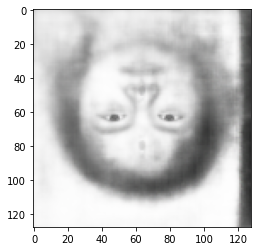

1/1 [==============================] - 0s 22ms/step
0.99161094
0.18724373


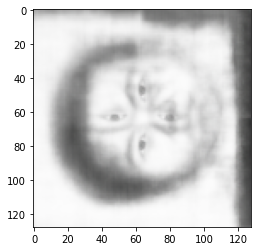

1/1 [==============================] - 0s 23ms/step
0.99947923
0.309181


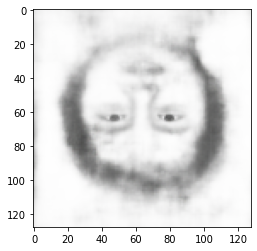

1/1 [==============================] - 0s 21ms/step
0.9928058
0.37713885


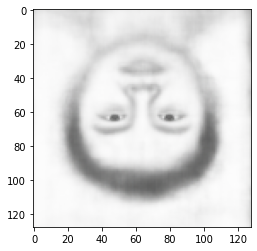

1/1 [==============================] - 0s 23ms/step
0.99690574
0.20525837


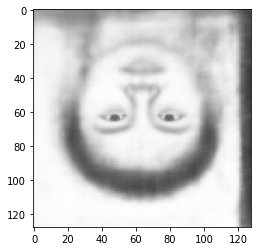

1/1 [==============================] - 0s 21ms/step
0.9968341
0.27913183


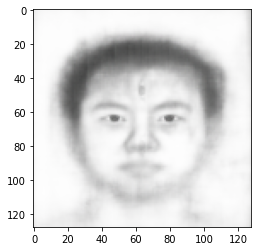

In [32]:
# 使用VAE模型生成素描图片
for fileName in os.listdir(filePath3):
    # 读取输入图片
    image_tmp = Image.open(os.path.join(filePath3, fileName))
    
    # 转换为模型的输入格式
    image_tmp = image_tmp.resize((128, 128))
    img_tmp = np.array(image_tmp).reshape((1,128,128,3)).astype('float32') / 255.

    # 使用VAE模型生成素描图片
#    z_mean,_ = encoder.predict(img_tmp)
#    sketch_img = decoder.predict(x=z_mean)
    sketch_img = ae.predict(img_tmp.reshape(1,128,128,3))
    sketch_img = np.clip(sketch_img, 0.0, 1.0)
    sketch_image = sketch_img.reshape(128,128,3)
#    sketch_img = np.clip(sketch_img, 0.0, 1.0)
#    sketch_img.reshape(128,128,1)
    print(np.max(sketch_img))
    print(np.min(sketch_img))
#    print(sketch_img)
#    sketch_image = Image.fromarray(sketch_img)
    plt.imshow(sketch_image)
    plt.show()
    